<a href="https://colab.research.google.com/github/ramirog034/TQx/blob/main/CSCE_55603_TQx_Modifications.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Clone GitHub Repo

In [2]:
# clone the repo
!git clone https://github.com/QuIIL/TQx

Cloning into 'TQx'...
remote: Enumerating objects: 99, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 99 (delta 6), reused 16 (delta 5), pack-reused 76 (from 1)
Receiving objects: 100% (99/99), 243.10 MiB | 44.44 MiB/s, done.
Resolving deltas: 100% (32/32), done.
Updating files: 100% (41/41), done.


# Imports

In [3]:
!pip install open-clip-torch
!pip install transformers accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.9 MB/s eta 0:00:00


In [4]:
import pickle
import numpy as np
import torch
import os
import shutil
import pandas as pd
import argparse
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import csv
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, cohen_kappa_score, confusion_matrix, silhouette_score
from sklearn.manifold import TSNE
from matplotlib.ticker import FuncFormatter
from sklearn.cluster import KMeans
from matplotlib import cm
from sklearn.preprocessing import StandardScaler
from PIL import Image
from IPython.display import display
import open_clip
import torch.nn.functional as F
from transformers import CLIPModel, CLIPTokenizer, CLIPProcessor

# Mount Google Drive

This code does not run by default.

To test all 4 datasets (BACH, Colon, WSSS4LUAD, Bladder):
1. Click the link at the bottom of the original TQx GitHub repo found at https://github.com/QuIIL/TQx to receive a shared copy of the Bladder .pkl and .txt files in your Drive
2. Uncomment the last two code cells to mount Google Drive and copy the shared files into the cloned repo
3. After step 2, all necessary files are available. Follow instructions in T-SNE section to generate results

In [5]:
bladder_exists = False

In [7]:
# # mount google drive
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
# # Define source and destination paths
# drive_path = '/content/drive/MyDrive/Bladder/'
# dest_path = '/content/TQx/results/Bladder/'

# # List of files to copy
# files_to_copy = [
#     'all_img_features_sorted.pkl',
#     'all_img_features_sorted_test.pkl',
#     'all_img_features_sorted_train.pkl',
#     'all_img_features_sorted_valid.pkl',
#     'img_info_test.txt',
#     'img_info_train.txt',
#     'img_info_valid.txt'
# ]

# for filename in files_to_copy:
#   source_file = os.path.join(drive_path, filename)
#   destination_file = os.path.join(dest_path, filename)

#   # if a file exists, copy it and set bladder_exists to true
#   if os.path.exists(source_file):
#     shutil.copyfile(source_file, destination_file)
#     bladder_exists = True
#   # if any file doesn't exist, set bladder_exists to false, print warning and quit this block
#   else:
#     bladder_exists = False
#     print(f"Warning: {filename} not found at {drive_path}. bladder_exists set to false")
#     break

# Softmax Function

In [9]:
def softmax(x):
    e_x = np.exp(x - np.max(x))  # Subtracting np.max(x) for numerical stability
    return 100* e_x / e_x.sum(axis=0)

# Mappings

In [10]:
def config_for_dataset(dataset):
    ###########################################################################
    # added directory version of dataset names for each if statement
    # got rid of redefinition of mappings for colon and bladder
    if dataset in ['colon-1', 'Colon']:
        mapping = {'moderately differentiated cancer': 'MD',
                    'poorly differentiated cancer': 'PD',
                    'benign': 'BN',
                    'well differentiated cancer': 'WD'}
        mapping_2 = {'moderately differentiated cancer': 2,
                    'poorly differentiated cancer': 3,
                    'benign': 0,
                    'well differentiated cancer': 1}
        mapping_3 = {2: 'MD',
                    3: 'PD',
                    0: 'BN',
                    1: 'WD'}
        custom_order=['BN', 'WD', 'MD', 'PD']
    elif dataset in ['luad', 'WSSS4LUAD']:
        mapping = {'tumor': 'TUM',
                    'normal': 'NOR'}
        mapping_2 = {'tumor': 1,
                    'normal': 0}
        mapping_3 = {1:'TUM',
                    0:'NOR'}
        custom_order=['NOR', 'TUM']
    elif dataset in ['bach', 'BACH']:
        mapping = {'invasive carcinoma': 'IVS',
                   'in situ carcinoma': 'SITU',
                    'benign': 'BN',
                    'normal': 'NOR'}
        mapping_2 = {'invasive carcinoma': 3,
                   'in situ carcinoma': 2,
                    'benign': 1,
                    'normal': 0}
        mapping_3 = {1:'BN',
                     2: 'SITU',
                     3: 'IVS',
                    0:'NOR'}
        custom_order=['NOR', 'BN', 'SITU', 'IVS']
    elif dataset in ['bladder', 'Bladder']:
        mapping = {'high grade cancer': 'HIGH',
                   'low grade cancer': 'LOW',
                    'normal': 'NOR'}
        mapping_2 = {'high grade cancer': 2,
                     'low grade cancer': 1,
                    'normal': 0}
        mapping_3 = {2: 'HIGH',
                    1:'LOW',
                    0:'NOR'}
        custom_order=['NOR', 'LOW', 'HIGH']
    return mapping, mapping_2, mapping_3, custom_order

# Clustering

In [11]:
%cd TQx/

/content/TQx


In [12]:
def clustering(args, features, img_label, path, postfix):
    features = torch.tensor(features).numpy()

    y = img_label
    mapping = config_for_dataset(args.dataset)[1]
    y = [mapping[i] for i in y]

    label_mapping = config_for_dataset(args.dataset)[2]
    cluster_labels_list = []

    kmeans = KMeans(n_clusters=len(label_mapping), init='k-means++', n_init='auto')
    cluster_labels = kmeans.fit_predict(features)
    cluster_labels_list.append(cluster_labels)

    return cluster_labels_list

def scale_list(original_list, scale_factor):
    scaled_list = []
    for item in original_list:
        scaled_list.extend([item] * scale_factor)
    return scaled_list

def save_string_to_file(string, file_path):
    with open(file_path, 'w') as file:
        file.write(string)

def analyze_clustering(args, raw_df, path, postfix):
    raw_df = raw_df[raw_df['match_rank'] < args.top_analyze]
    df = raw_df[raw_df['match_rank']==1]
    df['label'] = df['label'].map(args.mapping)
    k = df['label'].nunique()
    labels = df['label'].unique()
    custom_order = args.custom_order
    custom_values = df['label'].value_counts()

    fig, axes = plt.subplots(1, k, figsize=(3*k, 2.3))
    s = ''

    ###########################################################################
    # updated if statements to include directory version of datasets
    if args.dataset in ['colon-1', 'Colon']:
        display = 'Colon'
    elif args.dataset in ['bladder', 'Bladder']:
        display = 'Bladder'
    elif args.dataset in ['bach', 'BACH']:
        display = 'BACH'
    elif args.dataset in ['luad', 'WSSS4LUAD']:
        display = 'WSSS4LUAD'

    green = '#55a868'
    orange = '#dd8452'
    red = '#c44f52'
    blue = '#4c72b0'

    colors = [green, blue, orange, red]

    for cluster in range(k):
        entities_counts = raw_df[raw_df[f'k = {k}'] == cluster]['entity'].value_counts().head(20).to_string()
        s += entities_counts + '\n'
        value_counts = df[df[f'k = {k}'] == cluster]['label'].value_counts().reindex(custom_order)

        value_counts = value_counts / df[df[f'k = {k}'] == cluster]['label'].value_counts().sum()
        # value_counts = value_counts / value_counts.index.map(custom_values)
        ax = axes[cluster]

        df2 = value_counts.to_frame().reset_index()
        df2.columns = ['Category', 'Count']

        sns.barplot(ax=ax,
                    x='Category',
                    y='Count',
                    data=df2,
                    palette=colors,
                    width=1/2
                    )

        ax.set_title(f'Cluster {cluster+1}')
        ax.title.set_size(17)
        ax.tick_params(axis='x', labelsize=13)
        ax.set_xlabel('')
        ax.set_ylabel('')

    # Function to format tick labels
    def format_ticks(x, pos):
        return "{:.1f}".format(x)

    # Apply formatting to both axes
    # plt.gca().xaxis.set_major_formatter(FuncFormatter(format_ticks))
    for ax in axes.flat:
        ax.yaxis.set_major_formatter(FuncFormatter(format_ticks))

    fig.suptitle(f'Clusters for {args.dataset}')
    plt.tight_layout()
    plt.savefig(f'{path}/k-{k}{postfix}-within.png', dpi=600)
    file_path = f'{path}/common_terms-within.txt'
    save_string_to_file(s, file_path)

def calculate_sim(args):
    ###########################################################################
    # added the if else block to locally define display
    # Corrected logic to ensure 'display' is always assigned based on args.dataset
    if args.dataset in ['colon-1', 'Colon']:
        display = 'Colon'
    elif args.dataset in ['bladder', 'Bladder']:
        display = 'Bladder'
    elif args.dataset in ['bach', 'BACH']:
        display = 'BACH'
    elif args.dataset in ['luad', 'WSSS4LUAD']:
        display = 'WSSS4LUAD'

    print(f'Clustering {args.dataset}')
    postfix = args.postfix

    ###########################################################################
    # changed args.dataset to display and changed result to results everywhere
    entity_name_path = 'entity.csv'
    entity_feature_path = 'entity_ALL_FEATURES.pkl'
    image_feature_path = f'results/{display}/all_img_features_sorted{postfix}.pkl'
    image_info_path = f'results/{display}/img_info{postfix}.txt'

    filters = args.filters
    path = f'results/{display}/{filters}_{args.top_freq_words}_{args.top_freq_features_to_combine}'

    entity_name = pd.read_csv(entity_name_path)
    with open(entity_feature_path, 'rb') as f:
        entity_feature = pickle.load(f)
    with open(image_feature_path, 'rb') as f:
        image_feature = pickle.load(f)
    with open(image_info_path, 'r') as file:
        img_files = file.readlines()

    # FILTER 1 using semantic name
    if len(args.filter_semantic_name) != 0:
        mask = entity_name['semantic_name'].isin(args.filter_semantic_name)
        indices = entity_name.index[mask]
        entity_name = entity_name.iloc[indices].reset_index(drop=True)
        entity_feature = torch.index_select(entity_feature, 0, torch.tensor(indices))

    norm_entity_feature = entity_feature / entity_feature.norm(dim=-1, keepdim=True)
    norm_image_feature = image_feature/ image_feature.norm(dim=-1, keepdim=True)

    sim = norm_image_feature @ norm_entity_feature.T

    # FILTER 2 using top freq words
    sorted_indices = torch.argsort(sim, dim=1, descending=True)
    ranks = torch.zeros_like(sorted_indices, dtype=torch.float)
    for i in range(sim.shape[0]):  # Iterate over rows
        ranks[i, sorted_indices[i, :]] = torch.arange(sim.shape[1], dtype=torch.float) + 1
    ranks = torch.sum(ranks, dim=0)/sim.shape[0]  # avg rank of each word
    entity_name['avg_ranking'] = ranks.numpy()
    entity_name = entity_name.nsmallest(args.top_freq_words, 'avg_ranking')
    indices = entity_name.index
    entity_feature = torch.index_select(entity_feature, 0, torch.tensor(indices))
    entity_name = entity_name.reset_index(drop=True)

    norm_entity_feature = entity_feature / entity_feature.norm(dim=-1, keepdim=True)
    sim = norm_image_feature @ norm_entity_feature.T

    image_text_representation = torch.matmul(sim, entity_feature)/torch.sum(sim,dim=1)[:,None]

    if not os.path.exists(f'{path}'):
        os.makedirs(f'{path}')
    with open(f'{path}/image_text_representation{postfix}.pkl', 'wb') as file:
        pickle.dump(image_text_representation, file)

    top_values, top_indices = torch.topk(sim, k=args.top_freq_features_to_combine, dim=1) # shape (num_img, top_entities)
    m = torch.nn.Softmax(dim=1)
    softmax_output = m(sim)
    top_values_2, top_indices_2 = torch.topk(softmax_output, k=args.top_freq_features_to_combine, dim=1)

    ###########################################################################
    # updated elif to include directory version of luad
    if args.dataset == 'gastric':
        split = '.jpg,'
    elif args.dataset in ['luad', 'WSSS4LUAD']:
        split = '.png,'
    else:
        split = ','

    img_path = [file.split(split)[0] for file in img_files]
    img_path = scale_list(img_path, args.top_freq_features_to_combine)

    raw_label = [file.split(split)[1][:-2] for file in img_files]
    label = scale_list(raw_label, args.top_freq_features_to_combine)

    match_rank = [i for i in range(args.top_freq_features_to_combine)]
    match_rank = match_rank * len(img_files)

    top_idx = pd.Series(top_indices.view(-1))
    entity = top_idx.map(entity_name['entity_name'].to_dict())
    entity_semantic = top_idx.map(entity_name['semantic_name'].to_dict())

    probability = top_values.view(-1)
    cosine_sim = top_values_2.view(-1)

    if not os.path.exists(path):
        os.makedirs(path)
    cluster_labels_list = clustering(args, image_text_representation, raw_label, path, postfix)[0]

    columns = ["image_path", "label", "match_rank", "entity", "entity_semantic", "probability", 'cosine_sim']
    df = pd.DataFrame(columns=columns)
    df['image_path'] = img_path
    df['match_rank'] = match_rank
    df['label'] = label
    df['entity'] = entity
    df['entity_semantic'] = entity_semantic
    df['probability'] = probability
    df['cosine_sim'] = cosine_sim
    filters = ('_').join(args.filter_semantic_name).replace(' ','_').replace(';','')
    df[f"k = {df['label'].nunique()}"] = np.repeat(cluster_labels_list, args.top_freq_features_to_combine)
    df_csv = df[df['match_rank'] < args.top_words_in_csv]
    df_csv.to_csv(f'{path}/top_{args.top_words_in_csv}{args.postfix}.csv', index=False)

    analyze_clustering(args, df, path, postfix)
    ###########################################################################
    # return cluster_labels_list to use for cluster labels t-SNE
    return cluster_labels_list

# Metrics

In [13]:
def measure_metrics(dataset, pred, label):
    # datasets besides wsss4luad
    ###########################################################################
    if dataset in ['colon-1', 'colon-2', 'prostate-1', 'prostate-2', 'prostate-3',
                   'gastric','kidney','liver','bladder','bach','panda',
                   'BACH', 'Colon', 'Bladder']:
        acc = accuracy_score(label, pred)

        excluded_class = 0

        temp_1 = []
        temp_2 = []
        for i, l in enumerate(label):
            if l != excluded_class:
                temp_1.append(l)
                temp_2.append(pred[i])
        acc_grading = accuracy_score(temp_1, temp_2)
        f1 = f1_score(label, pred, average='macro')
        kappa = cohen_kappa_score(label, pred, labels=np.arange(len(np.unique(pred))), weights='quadratic')
        cm = confusion_matrix(label, pred, labels=[0,1,2,3])
        result = (acc, acc_grading, f1, kappa, cm)
    # wsss4luad
    else:
        acc = accuracy_score(label, pred)
        f1 = f1_score(label, pred, average='macro')
        rec = recall_score(label, pred, average='macro')
        pre = precision_score(label, pred, average='macro')
        cm = confusion_matrix(label, pred, labels=[0,1,2,3])
        result = (acc, pre, f1, rec, cm)

    return result

# Classification

In [14]:
def classify(args):
    print(args.test, args.feature_type, args.filter_semantic_name)

    # define the MLP classifier
    # linear layer -> normalize -> relu -> linear layer -> output
    class MLP(nn.Module):
        def __init__(self, input_size, hidden_size, output_size):
            super(MLP, self).__init__()
            self.fc1 = nn.Linear(512, 2048)
            self.relu = nn.ReLU()
            self.fc2 = nn.Linear(2048, output_size)
            self.bnorm = nn.BatchNorm1d(2048)

        def forward(self, x):
            x = self.fc1(x)
            x = self.bnorm(x)
            x = self.relu(x)
            x = self.fc2(x)
            return x

    # grab string to int mapping
    mapping = config_for_dataset(args.dataset)[1]

    # neoplastic process
    filters = args.filters

    # both paths = results/dataset/Neoplastic_Process_1000_1000
    path1 = f'results/{args.dataset}/{filters}_{args.top_freq_words}_{args.top_freq_features_to_combine}'
    path2 = f'results/{args.test}/{filters}_{args.top_freq_words}_{args.top_freq_features_to_combine}'

    # grab text-based image embeddings
    if args.feature_type == 'text':
        train_feature_path = f'{path1}/image_text_representation_train.pkl'
        valid_feature_path = f'{path1}/image_text_representation_valid.pkl'
        test_feature_path = f'{path2}/image_text_representation_test.pkl'

    # grab visual embeddings
    elif args.feature_type == 'image':
        train_feature_path = f'results/{args.dataset}/all_img_features_sorted_train.pkl'
        valid_feature_path = f'results/{args.dataset}/all_img_features_sorted_valid.pkl'
        test_feature_path = f'results/{args.test}/all_img_features_sorted_test.pkl'

    # i don't think this is actually used, these datasets are not discussed anywhere
    if args.test in ['colon-2', 'prostate-2', 'prostate-3', 'k16']:
        test_feature_path = test_feature_path.replace('_test', '')

    # load the training features
    with open(train_feature_path, 'rb') as file:
        train_feature = pickle.load(file)

    # load the training labels
    image_info_path = f'results/{args.dataset}/img_info_train.txt'
    with open(image_info_path, 'r') as file:
        train_img_files = file.readlines()

    ###########################################################################
    # updated elif to include directory version of luad
    if args.dataset == 'gastric':
        split = '.jpg,'
    elif args.dataset == 'luad' or args.dataset == 'WSSS4LUAD':
        split = '.png,'
    else:
        split = ','

    # for each line, split at delimiter, gives list like ["/img_11769_1", "benign.\n"] getting rid of .jpg,
    # [1] means second token, the label and :-2 removes trailing characters. could use .strip()
    train_label = [file.split(split)[1][:-2] for file in train_img_files]
    train_label_list = [mapping[label] for label in train_label]
    train_label = torch.tensor(train_label_list)

    # same for validation split
    with open(valid_feature_path, 'rb') as file:
        valid_feature = pickle.load(file)
    image_info_path = f'results/{args.dataset}/img_info_valid.txt'
    with open(image_info_path, 'r') as file:
        valid_img_files = file.readlines()
    valid_label = [file.split(split)[1][:-2] for file in valid_img_files]
    valid_label = [mapping[label] for label in valid_label]

    # same for testing split
    with open(test_feature_path, 'rb') as file:
        test_feature = pickle.load(file)
    image_info_path = f'results/{args.test}/img_info_test.txt'
    with open(image_info_path, 'r') as file:
        test_img_files = file.readlines()
    test_label = [file.split(split)[1][:-2] for file in test_img_files]
    test_label = [mapping[label] for label in test_label]

    # Define hyperparameters
    input_size = 512  # Size of the input features
    hidden_size = 4096  # Size of the hidden layer, but wasn't used by them
    output_size = len(set(test_label))

    ###########################################################################
    # changed cuda line to correctly use GPU. google colab has 1 usually, not 3
    # Initialize model, loss function, and optimizer
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    criterion = nn.CrossEntropyLoss()

    # Training loop
    num_epochs = 300

    temp = None

    # accuracy, accuracy cancer, f1, kw quadratic-weighted kappa score
    # accuracy, precision, f1, recall for wsss4luad
    metrics_list = [
        [],[],[],[]
    ]
    for seed in args.seed:
        torch.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        model = MLP(input_size, hidden_size, output_size).to(device)
        model.train()
        optimizer = optim.AdamW(model.parameters(), lr=0.01)
        max_f1 = 0
        for _ in range(num_epochs):
            # train
            optimizer.zero_grad()
            train_pred = model(train_feature.to(device))
            loss = criterion(train_pred, train_label.to(device))
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            # print(torch.argmax(train_pred[0]))
            train_pred = torch.argmax(train_pred, dim=1).tolist()

            val_predictions = model(valid_feature.to(device))
            val_predictions = torch.argmax(val_predictions, dim=1).tolist()

            test_predictions = model(test_feature.to(device))
            test_predictions = torch.argmax(test_predictions, dim=1).tolist()

            metrics = measure_metrics(args.dataset, val_predictions, valid_label)

            # if f1 of current epoch's val prediction is best then update temp using test
            if metrics[2] > max_f1:
                max_f1 = metrics[2]
                # measure_metrics returns tuple of 5 elements, but temp only gets first 4
                temp = measure_metrics(args.dataset, test_predictions, test_label)[:-1]
        # after training, place best temp into metrics_list
        # this happens per seed, so metrics_list[i] has 50 elements
        for i in range(4):
            metrics_list[i].append(temp[i])

    ###########################################################################
    # create header row of csv file with different metrics for WSSS4LUAD
    header_row = ['dataset', 'filters', 'feature_type', 'acc', 'acc_cancer', 'f1', 'kappa']
    if dataset == 'WSSS4LUAD':
      header_row[4] = 'precision'
      header_row[6] = 'recall'

    # create row of args and mean, std of metrics
    new_row = [args.test, filters, 'Text-based' if args.feature_type == 'text' else 'Visual',
               f"{np.mean(metrics_list[0]):.4f}+{np.std(metrics_list[0]):.4f}",
               f"{np.mean(metrics_list[1]):.4f}+{np.std(metrics_list[1]):.4f}",
               f"{np.mean(metrics_list[2]):.4f}+{np.std(metrics_list[2]):.4f}",
               f"{np.mean(metrics_list[3]):.4f}+{np.std(metrics_list[3]):.4f}"]

    # File path of the classification results CSV file
    file_path = f'{args.dataset}_classification_results.csv'

    # Check if the file exists to determine if header needs to be written
    file_exists = os.path.exists(file_path)

    # Open the CSV file in append mode
    with open(file_path, 'a', newline='') as file:
        # Create a CSV writer object
        writer = csv.writer(file)

        ###########################################################################
        # Write the header only if the file did not exist previously
        if not file_exists:
            writer.writerow(header_row)

        # Write the new row to the CSV file
        writer.writerow(new_row)

    print(temp)

# Cluster Plotting

In [15]:
###########################################################################
# added cluster_labels param. if not empty (i.e. if the cluster labels are passed)
# then cluster labels are used for plotting, else ground truth labels are used
def plotting_data_split(cluster_labels, args):
    # create t-SNE object to plot 2D graph, random state, disable progress logging
    tsne = TSNE(n_components=2,
                random_state=42, verbose=0)

    ###########################################################################
    # construct path to pickled embeddings for training set
    # use image (visual) or text (text-based image embeddings) embeddings depending on feature_type
    train_feature_path = f'results/{args.dataset}/Neoplastic_Process_1000_1000/image_text_representation_train.pkl'
    if args.feature_type == 'image':
        train_feature_path = f'results/{args.dataset}/all_img_features_sorted_train.pkl'
    # open in binary read mode and unpickle into train_feature tensor of 512 dims
    with open(train_feature_path, 'rb') as f:
        train_feature = pickle.load(f)
    # run t-SNE on it using fit_transform, returning 2D numpy array (samples, 2)
    tsne_train = tsne.fit_transform(train_feature)

    # same but for valid
    valid_feature_path = f'results/{args.dataset}/Neoplastic_Process_1000_1000/image_text_representation_valid.pkl'
    if args.feature_type == 'image':
        valid_feature_path = f'results/{args.dataset}/all_img_features_sorted_valid.pkl'
    with open(valid_feature_path, 'rb') as f:
        valid_feature = pickle.load(f)
    tsne_valid = tsne.fit_transform(valid_feature)

    # same but for test
    test_feature_path = f'results/{args.dataset}/Neoplastic_Process_1000_1000/image_text_representation_test.pkl'
    if args.feature_type == 'image':
        test_feature_path = f'results/{args.dataset}/all_img_features_sorted_test.pkl'
    with open(test_feature_path, 'rb') as f:
        test_feature = pickle.load(f)
    tsne_test = tsne.fit_transform(test_feature)

    # txt contain image filenames and their class labels separated by a delimiter
    img_info_train = f'results/{args.dataset}/img_info_train.txt'
    img_info_valid = f'results/{args.dataset}/img_info_valid.txt'
    img_info_test = f'results/{args.dataset}/img_info_test.txt'

    ###########################################################################
    # choose proper delimiter corresponding to dataset
    if args.dataset == 'gastric':
        split = '.jpg,'
    elif args.dataset == 'luad' or args.dataset == 'WSSS4LUAD':
        split = '.png,'
    else:
        split = ','

    ###########################################################################
    # select proper mappings based on dataset
    dataset_configs = config_for_dataset(args.dataset)

    # [0] is the string to acronym
    # [1] is string to int
    # [2] is int to acronym
    # [3] is the acronyms only, or custom order labels
    str_to_int_map = dataset_configs[1]
    int_to_str_map = dataset_configs[2]
    custom_order_str_labels = dataset_configs[3]

    # read all the lines from the train txt file, which contains ground truth labels labels
    with open(img_info_train, 'r') as file:
        img_files_train = file.readlines()
    # for each line, split at delimiter, gives list like ["/img_11769_1", "benign.\n"] getting rid of .jpg,
    # [1] means second token, the label and :-2 removes trailing characters. could use .strip()
    label_train_str = [file.split(split)[1][:-2] for file in img_files_train]
    # convert it to its corresponding int
    label_train_int = [str_to_int_map[label] for label in label_train_str]

    # same for valid
    with open(img_info_valid, 'r') as file:
        img_files_valid = file.readlines()
    label_valid_str = [file.split(split)[1][:-2] for file in img_files_valid]
    label_valid_int = [str_to_int_map[label] for label in label_valid_str]

    # same for test
    with open(img_info_test, 'r') as file:
        img_files_test = file.readlines()
    label_test_str = [file.split(split)[1][:-2] for file in img_files_test]
    label_test_int = [str_to_int_map[label] for label in label_test_str]

    # create 10in by 10in single subplot for visualization
    # subplots creates a Figure object which is overall container that holds canvas
    # may also create one or more Axes objects, the actual plotting areas/coordinate system inside the figure
    # 1, 1 means 1 row, 1 col so just a single Axes obj
    fig, axs = plt.subplots(1, 1, figsize=(10, 10))

    ###########################################################################
    # color scheme
    green = '#55a868'
    orange = '#dd8452'
    red = '#c44f52'
    blue = '#4c72b0'
    colors = [green, orange, blue, red]
    i = 0

    ###########################################################################
    # feature type
    if args.feature_type == 'image':
      ft = 'Visual embeddings'
    else:
      ft = 'Text-based image embeddings'

    ###########################################################################
    # find silhouette scores if cluster labels is not empty
    if len(cluster_labels) != 0:
        label_train_int = cluster_labels["_train"].tolist()
        label_valid_int = cluster_labels["_valid"].tolist()
        label_test_int = cluster_labels["_test"].tolist()

        # Calculate silhouette score
        all_tsne_features = np.concatenate((tsne_train, tsne_valid, tsne_test), axis=0)
        all_cluster_labels = np.concatenate((cluster_labels["_train"], cluster_labels["_valid"], cluster_labels["_test"]), axis=0)

        silhouette_avg = silhouette_score(all_tsne_features, all_cluster_labels)
        silhouette_text = f'{silhouette_avg:.2f}'

        # File path of the silhouette results CSV file
        file_path = f'{args.dataset}_silhouette.csv'

        # Check if .csv exists
        file_exists = os.path.exists(file_path)

        # rows
        header_row = ['dataset', 'feature_type', 'silhouette']
        new_row = [args.dataset, 'Text-based' if args.feature_type == 'text' else 'Visual', silhouette_text]

        # Open the CSV file in append mode
        with open(file_path, 'a', newline='') as file:
            # Create a CSV writer object
            writer = csv.writer(file)

            ###########################################################################
            # Write the header only if the file did not exist previously
            if not file_exists:
                writer.writerow(header_row)

            # Write the new row to the CSV file
            writer.writerow(new_row)

    # determine unique labels. since all splits use the same labels, any can be used
    unique_class_ids = np.unique(label_train_int)

    ###########################################################################
    # a handle is the thing next to the label. for us its the dots in the legend, one per class
    legend_handles = []
    legend_labels = []
    plotted_labels_for_legend = set() # To ensure each class label appears only once in the legend

    ###########################################################################
    for class_int_label in unique_class_ids:
        # Get the string representation for the legend
        class_str_label = int_to_str_map[class_int_label]

        # Iterate through the data splits one at a time so that feature_tsne is current split's t-SNE data,
        # and labels_int is corresponding list of labels
        # zip takes >=2 iterables and combines them element-wise into pairs
        # enumerate adds index counter starting with 0 default
        # so we get 3 iterations. first one uses (0, (tsne_train, label_train_int))
        for split_type_idx, (feature_tsne, labels_int) in enumerate(zip(
            [tsne_train, tsne_valid, tsne_test],
            [label_train_int, label_valid_int, label_test_int]
        )):
            # create numpy boolean mask selecting only the rows (points) belonging to current class
            current_class_features = feature_tsne[np.array(labels_int) == class_int_label]

            # Determine color from the original cycling list
            current_color = colors[i]

            # Only add label for legend once per class
            if class_str_label not in plotted_labels_for_legend:
                # draw the points
                # Store a proxy artist for the legend, using the first color encountered for this class
                # using : for all rows (all points) and 0 is x, 1 is y
                sc = axs.scatter(current_class_features[:, 0], current_class_features[:, 1],
                                 c=current_color, alpha=0.7, label=class_str_label)
                legend_handles.append(sc)
                legend_labels.append(class_str_label)
                plotted_labels_for_legend.add(class_str_label)
            else:
                # For subsequent plots of the same class (different splits), don't add a label
                axs.scatter(current_class_features[:, 0], current_class_features[:, 1],
                                 c=current_color, alpha=0.7)
        # update i. since we do this in the outer loop, color changes per class
        i += 1

    ###########################################################################
    # Use the collected handles and labels to create the legend
    axs.legend(handles=legend_handles, labels=legend_labels, title='Classes', loc='best')
    # dashed grid lines for visiblity
    axs.grid(True, linestyle='--', alpha=0.6)

    if len(cluster_labels) != 0:
      # set title of the image based on which labels we are using
      axs.set_title(f'{ft} for {args.dataset} cluster labels', fontsize = 24)
      # save to png and display plot
      plt.savefig(f'tsne_{ft}_{args.dataset}_cluster_labels.png', dpi=600)
    else:
      axs.set_title(f'{ft} for {args.dataset} true Labels', fontsize = 24)
      plt.savefig(f'tsne_{ft}_{args.dataset}_true_labels.png', dpi=600)

    plt.show()

# Main Function

In [16]:
###########################################################################
# add dataset, postfix, type params to enable calls to main using different arguments
def main(dataset, postfix, feature_type):
    parser = argparse.ArgumentParser()

    parser.add_argument('--dataset', default=dataset)
    parser.add_argument('--test', default=dataset)
    parser.add_argument('--feature_type', type=str, default=feature_type)
    parser.add_argument('--seed', default=list(range(50)))
    parser.add_argument('--plot', choices=['tsne','umap'], default='tsne')
    parser.add_argument('--filter_semantic_name', nargs='+', default=['Neoplastic Process;'])
    parser.add_argument('--filters',default='Neoplastic_Process')
    parser.add_argument('--postfix', default=postfix)
    parser.add_argument('--text_split_range', type=int, default=1)
    parser.add_argument('--img_split_range', type=int, default=8192)
    parser.add_argument('--device', type=int, default=2)
    parser.add_argument('--draw', type=bool, default=False)
    parser.add_argument('--num_workers', type=int, default=10)

    parser.add_argument('--top_words_in_csv', type=int, default=20)
    parser.add_argument('--top_analyze', default=50)
    parser.add_argument('--top_freq_features_to_combine', type=int, default=1000)
    parser.add_argument('--top_freq_words', type=int, default=1000)
    parser.add_argument('--n_clusters', default=[2,3,4,5,6,7])
    parser.add_argument('--mode', default='0')

    parser.add_argument('--mapping', default=
                        {'moderately differentiated cancer': 'MD',
                        'poorly differentiated cancer': 'PD',
                        'benign': 'BN',
                        'well differentiated cancer': 'WD'})
    parser.add_argument('--custom_order', default=['BN', 'WD', 'MD', 'PD'])

    args, unknown = parser.parse_known_args() # Modified to handle unknown arguments

    args.mapping = config_for_dataset(args.dataset)[0]
    args.custom_order = config_for_dataset(args.dataset)[-1]

    ###########################################################################
    # Calculate similarity and return class labels, args
    return calculate_sim(args), args

# T-SNE

This code assumes that the Bladder .pkl files don't exist on the grader's Google Drive. By default, results will only be generated for BACH dataset. Uncommenting the rest of the code in the first code cell (the if-else statement) will generate results for BACH, Colon, and WSSS4LUAD datasets. Bladder will also be included if user followed instructions in the Mount Drive section

In [17]:
datasets = ['BACH']
# if bladder_exists:
#   datasets = ['BACH', 'Colon', 'WSSS4LUAD', 'Bladder']
# else:
#   datasets = ['BACH', 'Colon', 'WSSS4LUAD']

The code below will generate and display the bar graphs and cluster plots for the desired dataset(s).

Clustering BACH


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering BACH


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering BACH


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

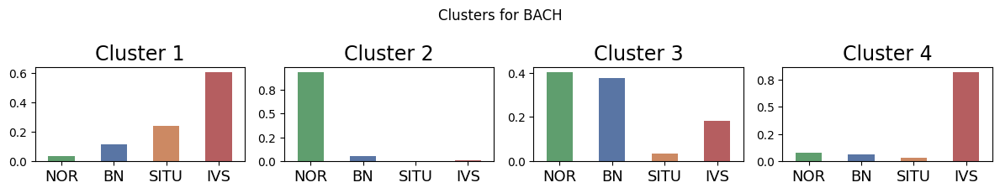

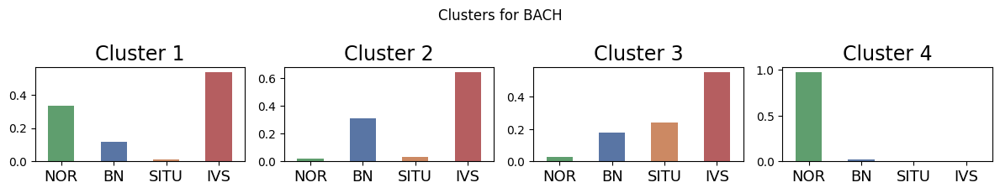

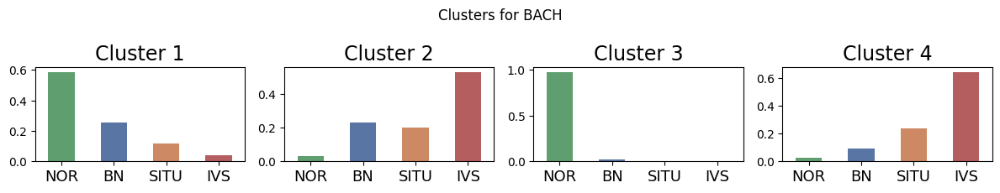

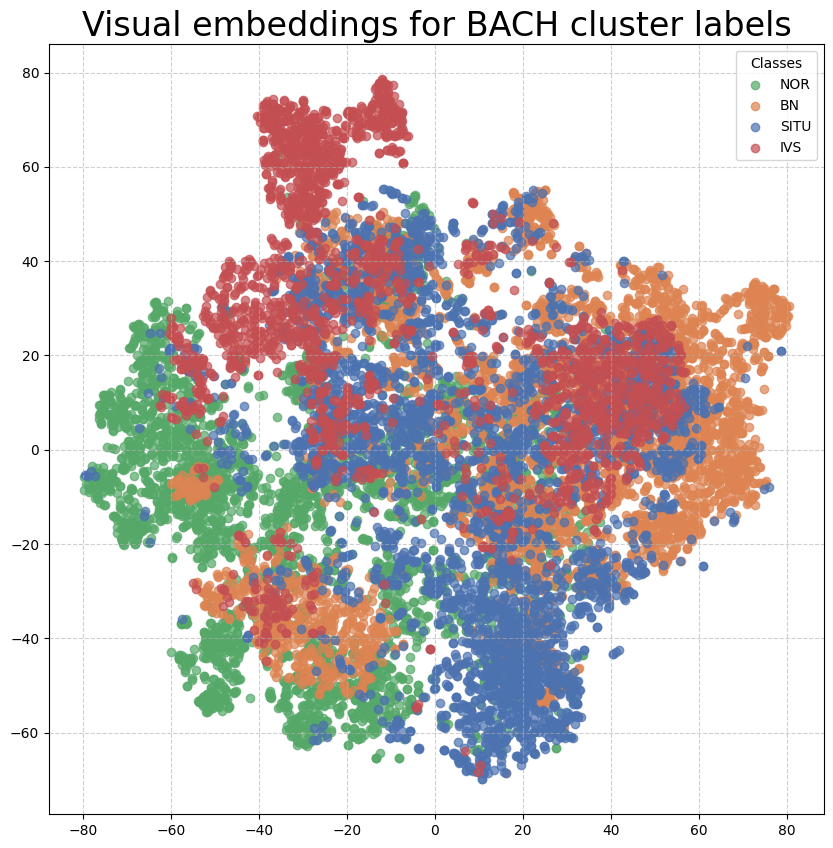

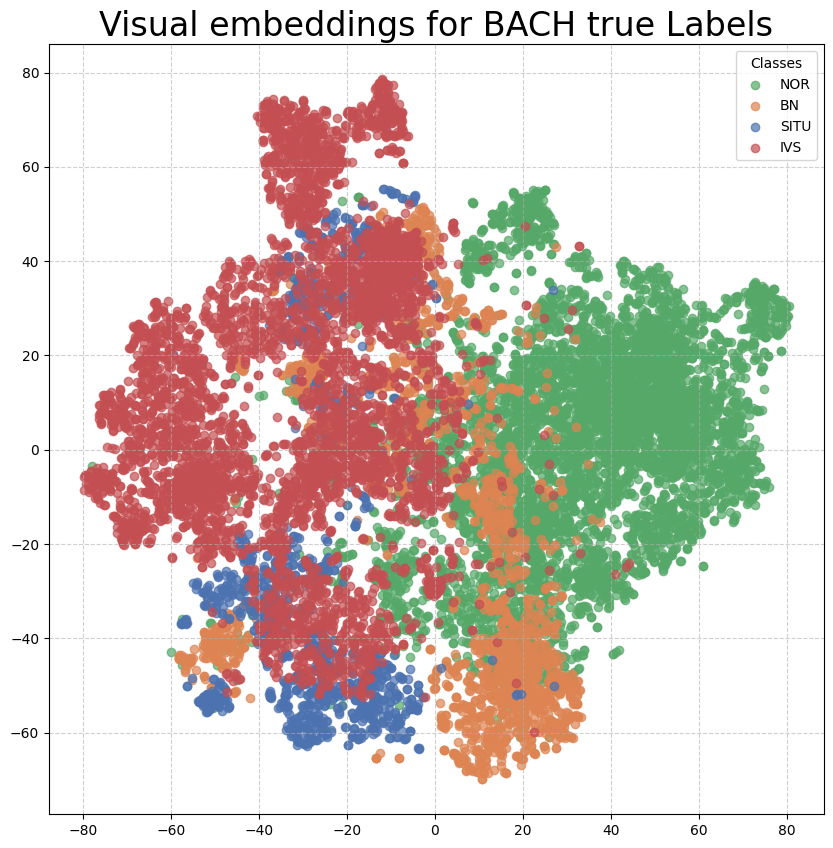

Clustering Colon


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering Colon


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering Colon


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

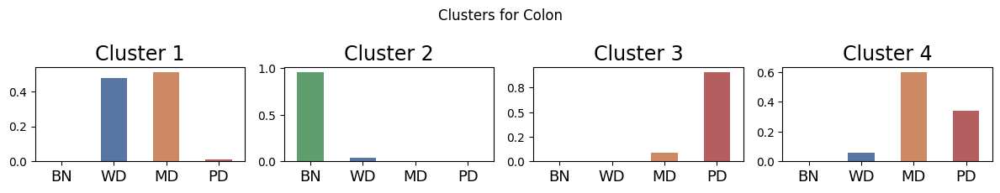

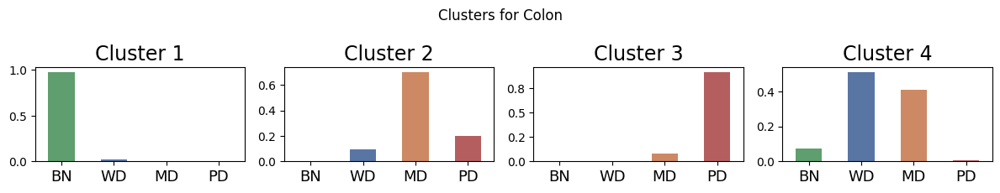

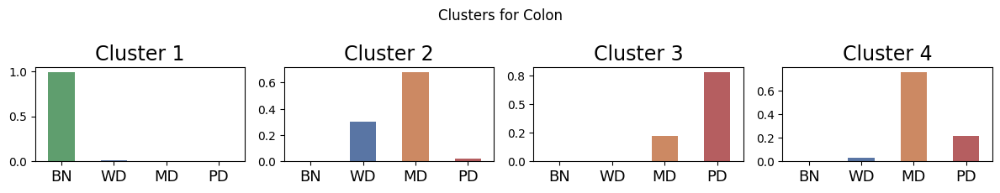

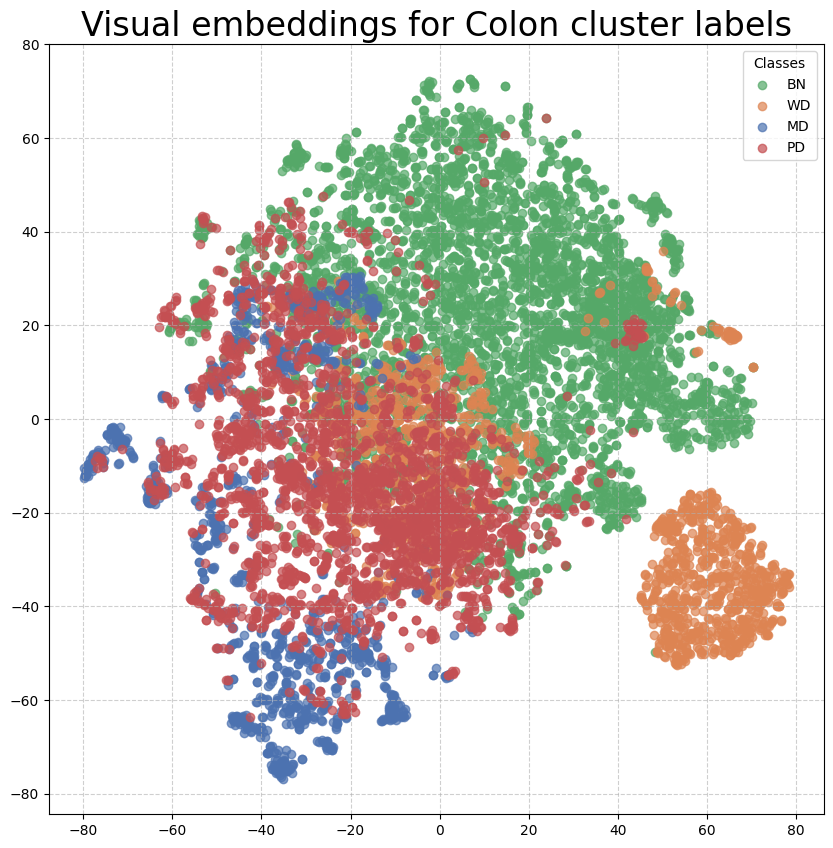

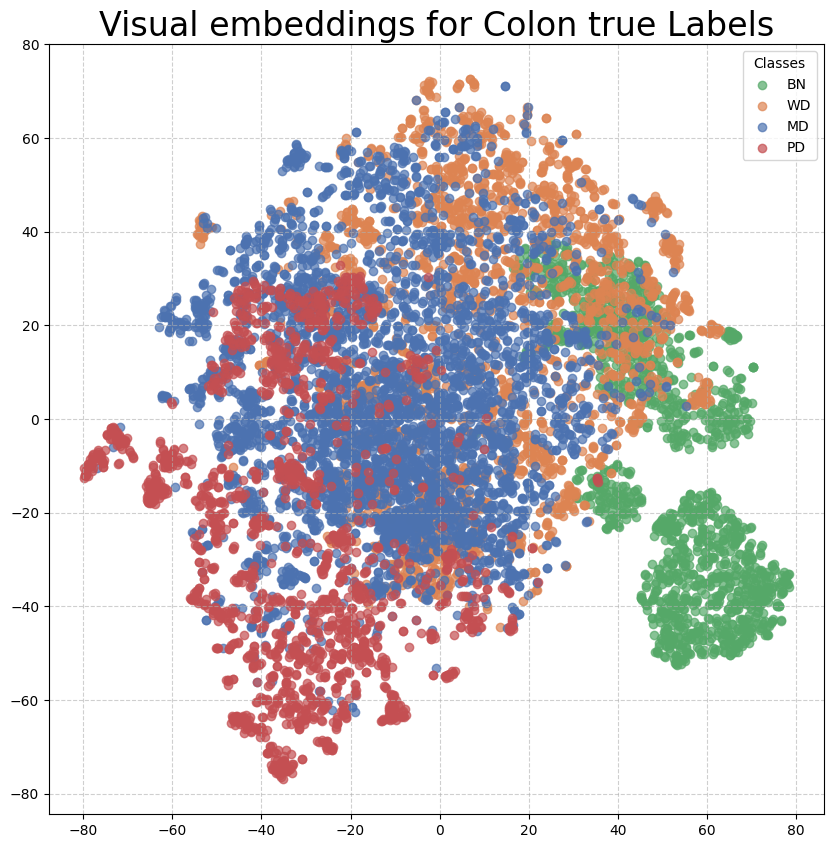

Clustering WSSS4LUAD


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (2), which ma

Clustering WSSS4LUAD


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (2), which ma

Clustering WSSS4LUAD


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (2), which ma

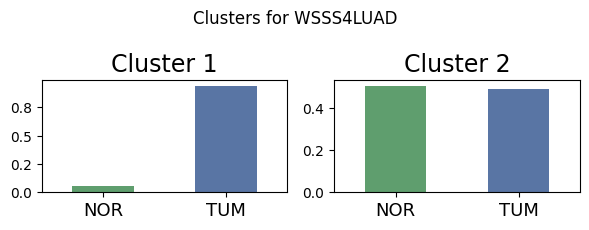

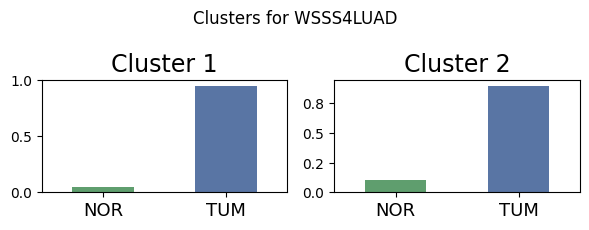

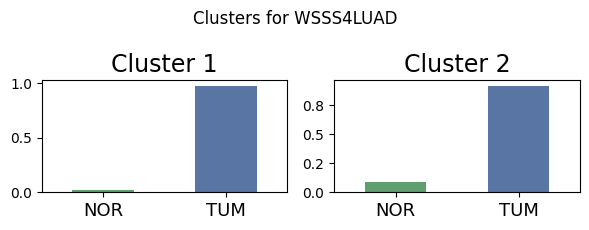

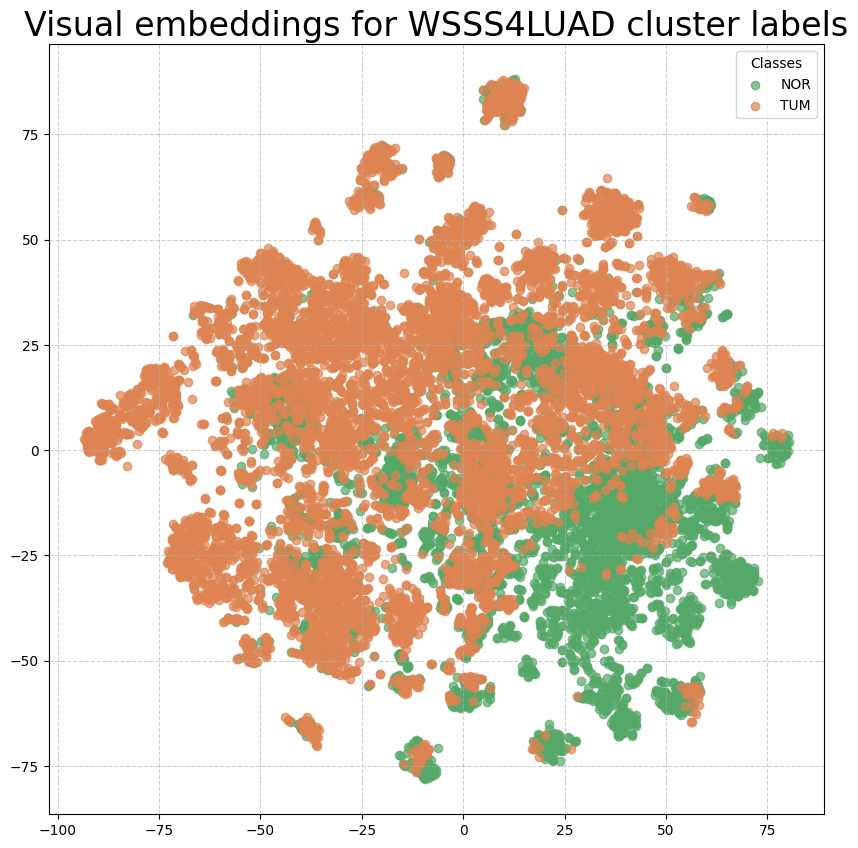

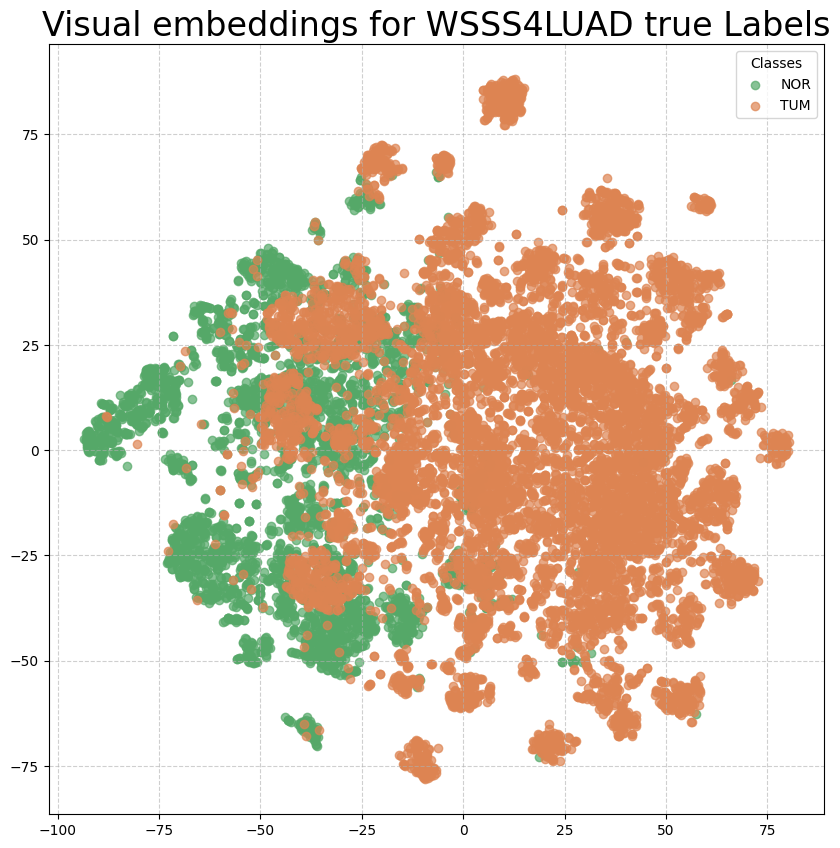

Clustering Bladder


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (3), which ma

Clustering Bladder


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (3), which ma

Clustering Bladder


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (3), which ma

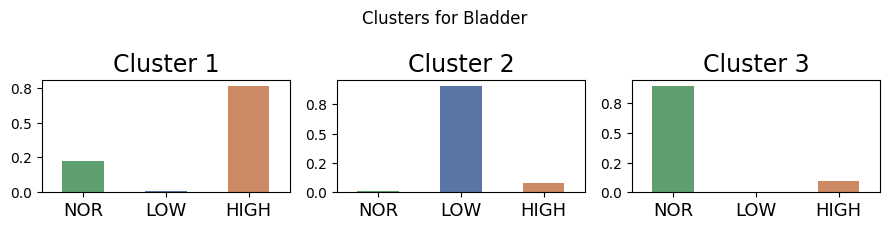

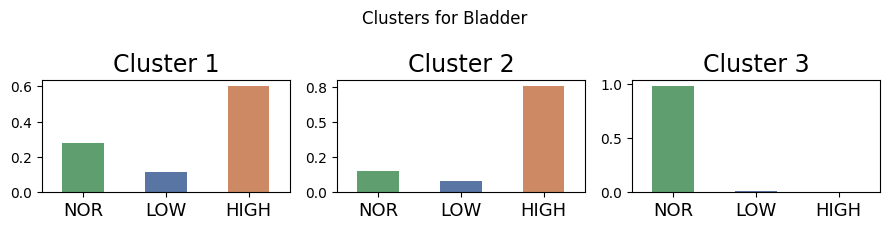

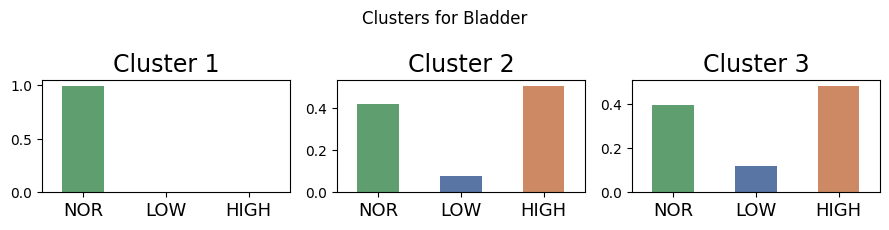

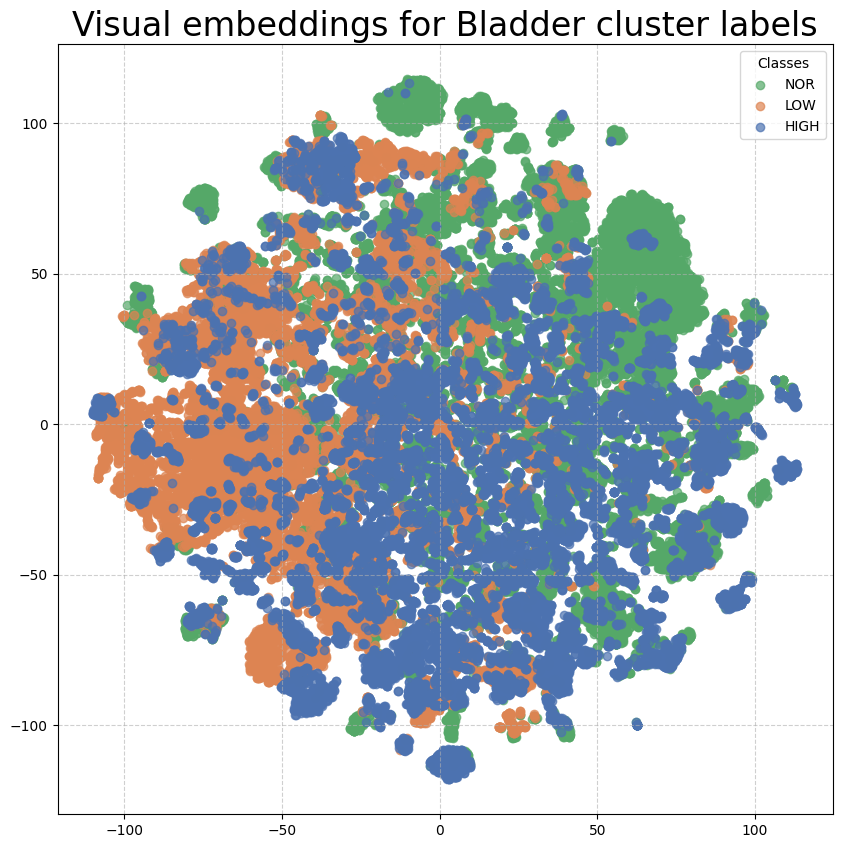

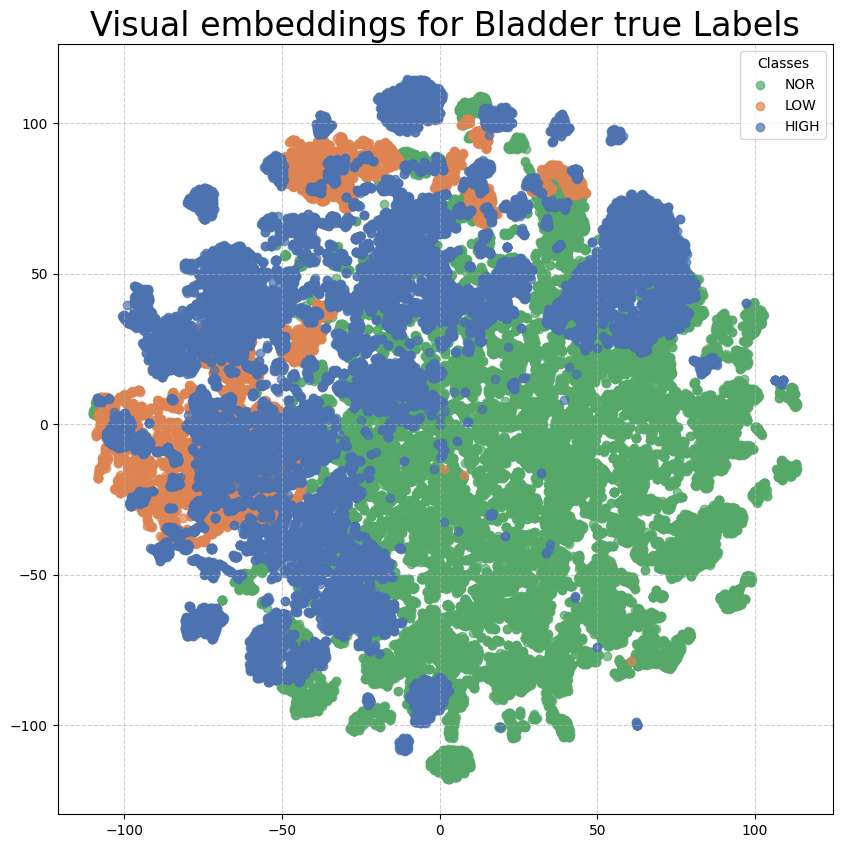

Bladder image ['Neoplastic Process;']
(0.8682045407206832, 0.8568394974340825, 0.7205000576008479, np.float64(0.7629817054784489))
Clustering BACH


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering BACH


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering BACH


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

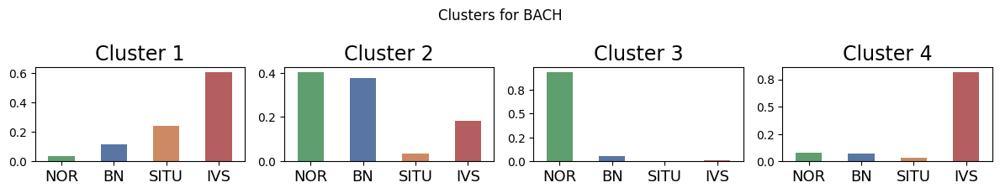

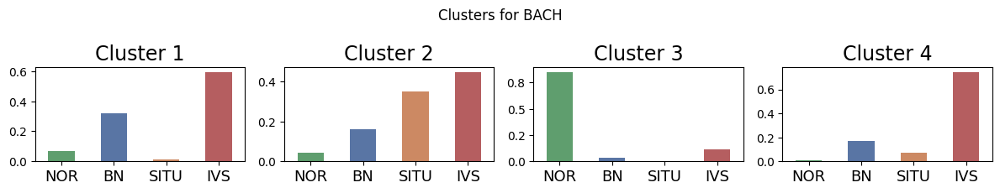

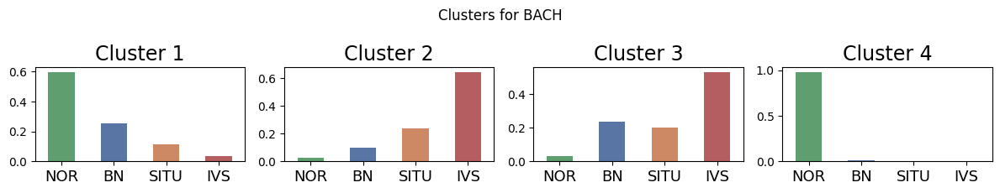

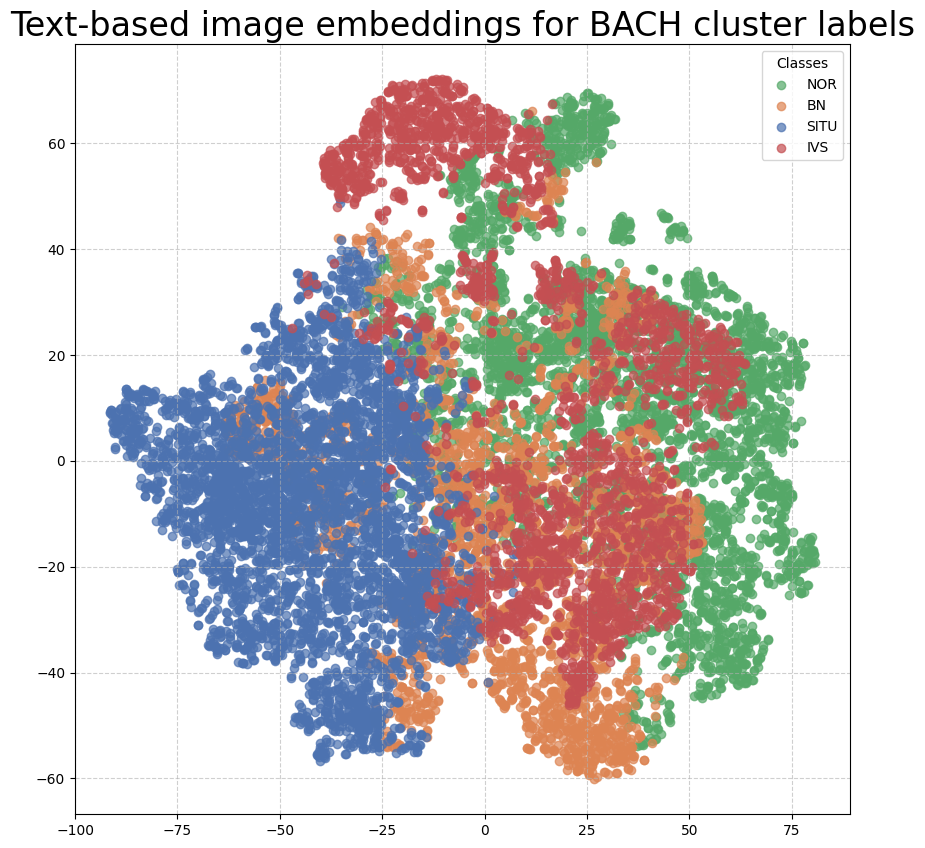

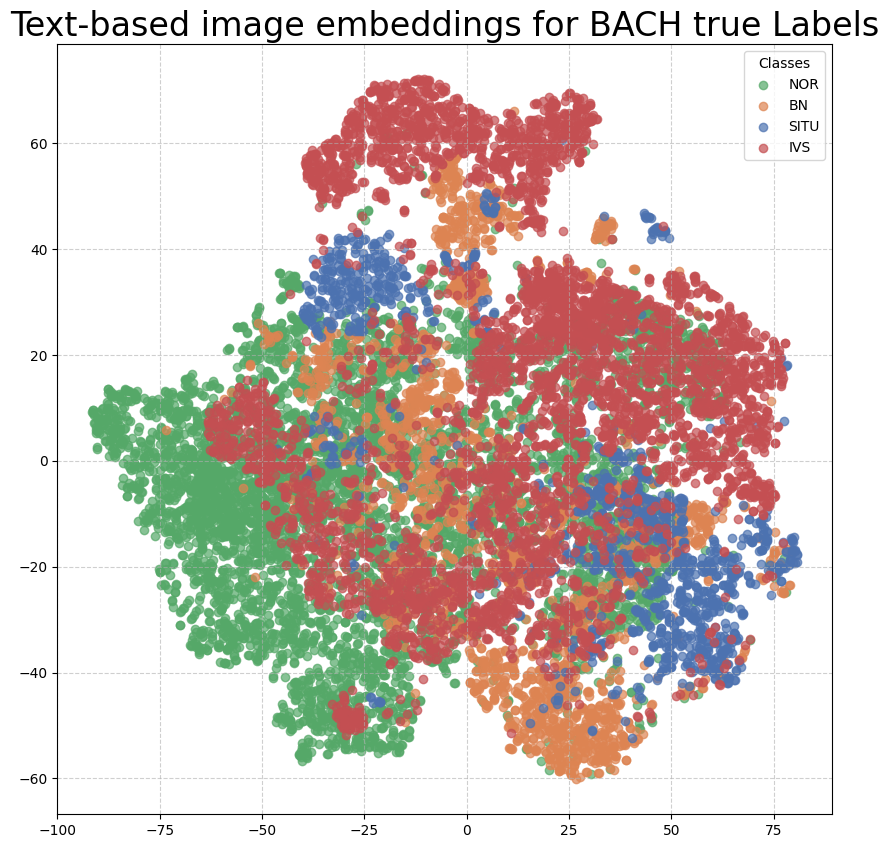

Clustering Colon


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering Colon


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

Clustering Colon


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

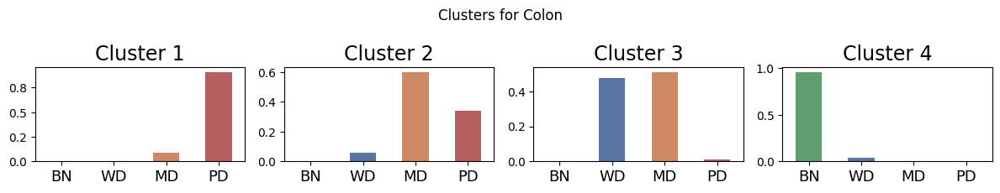

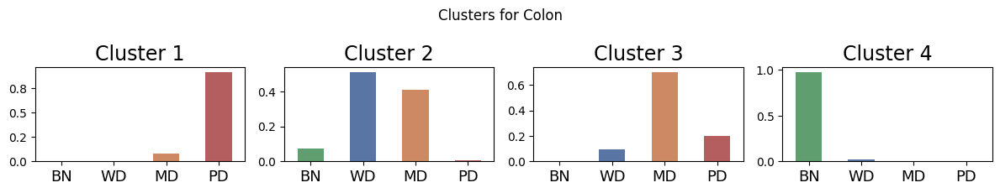

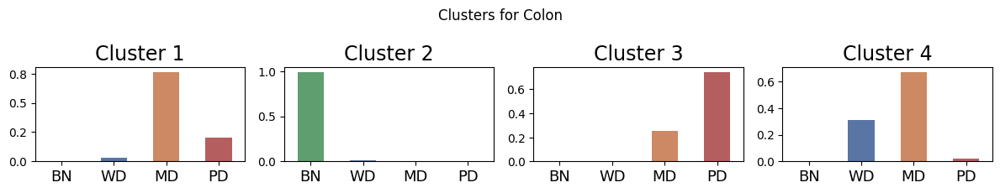

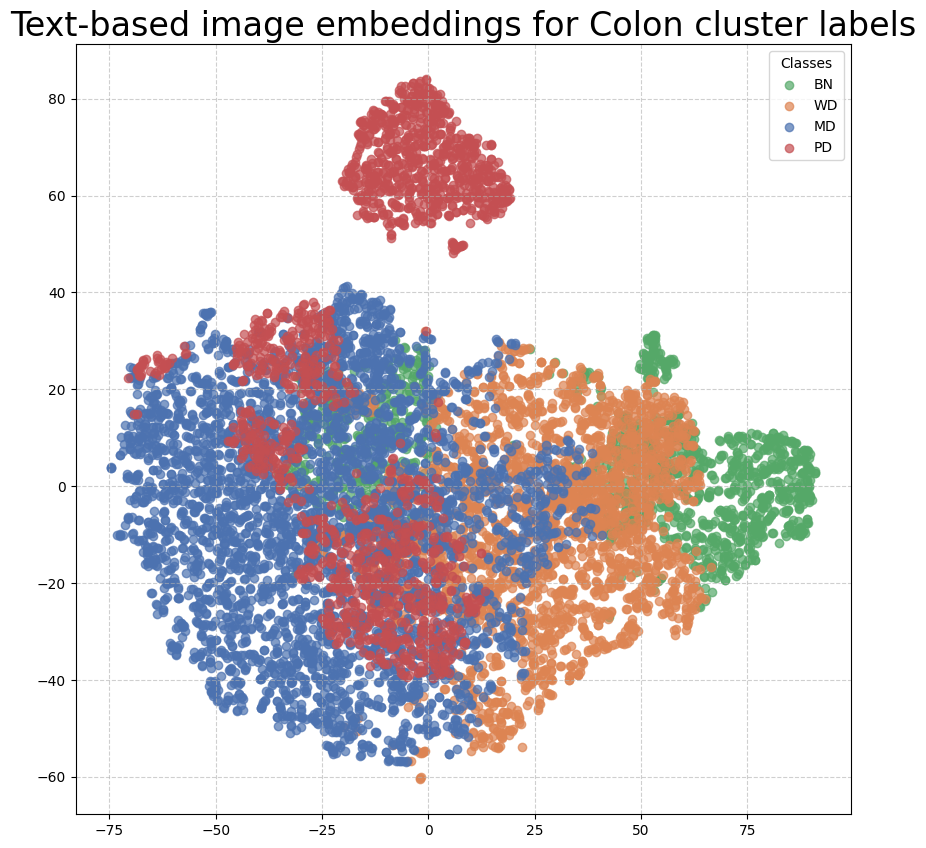

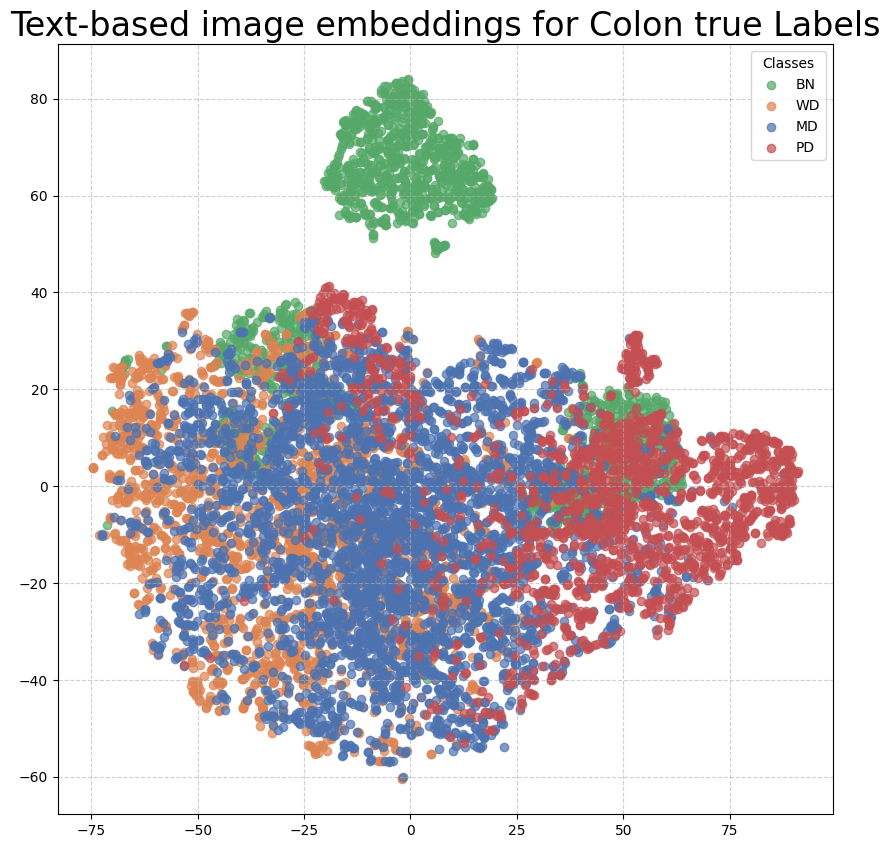

Clustering WSSS4LUAD


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (2), which ma

Clustering WSSS4LUAD


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (2), which ma

Clustering WSSS4LUAD


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (2), which ma

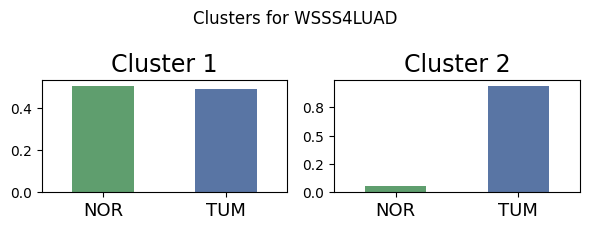

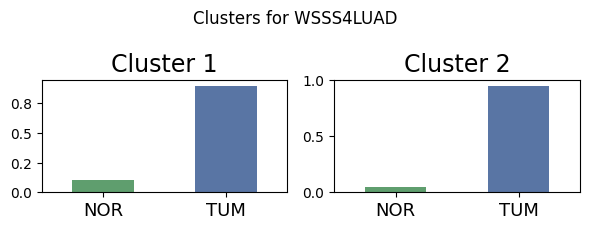

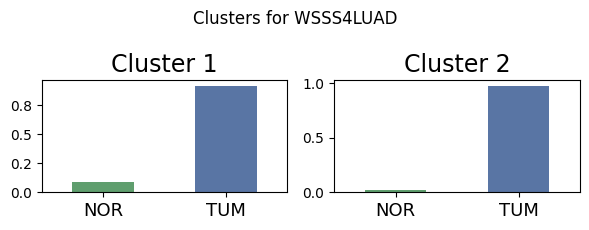

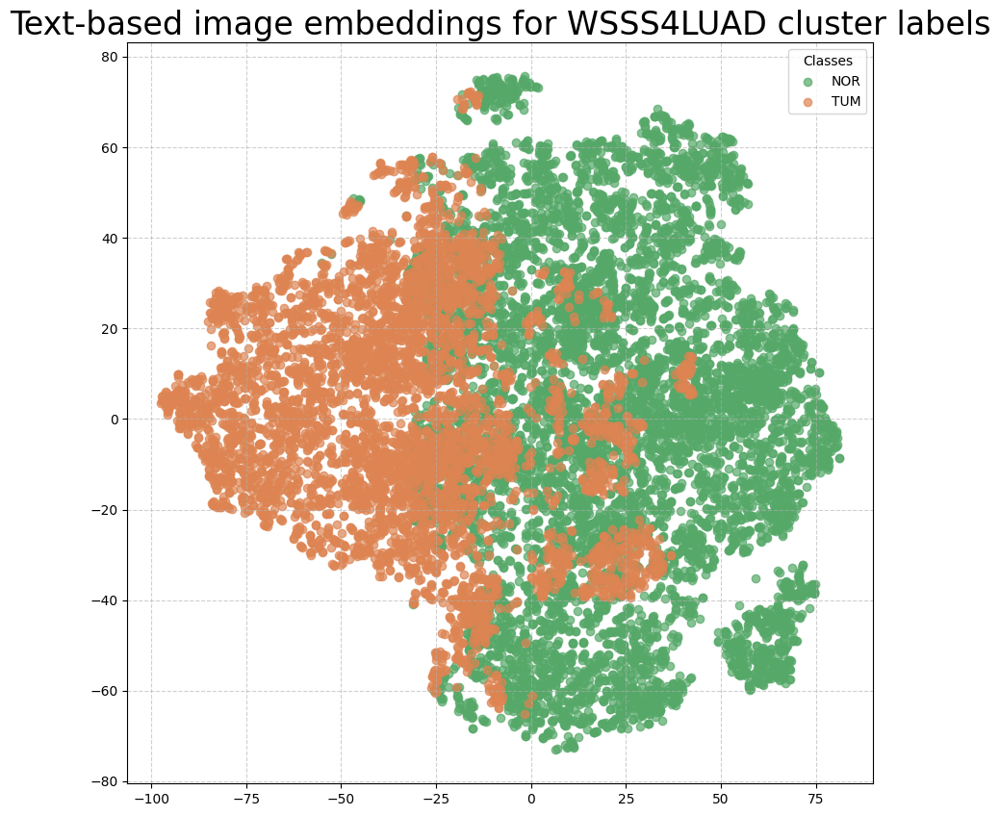

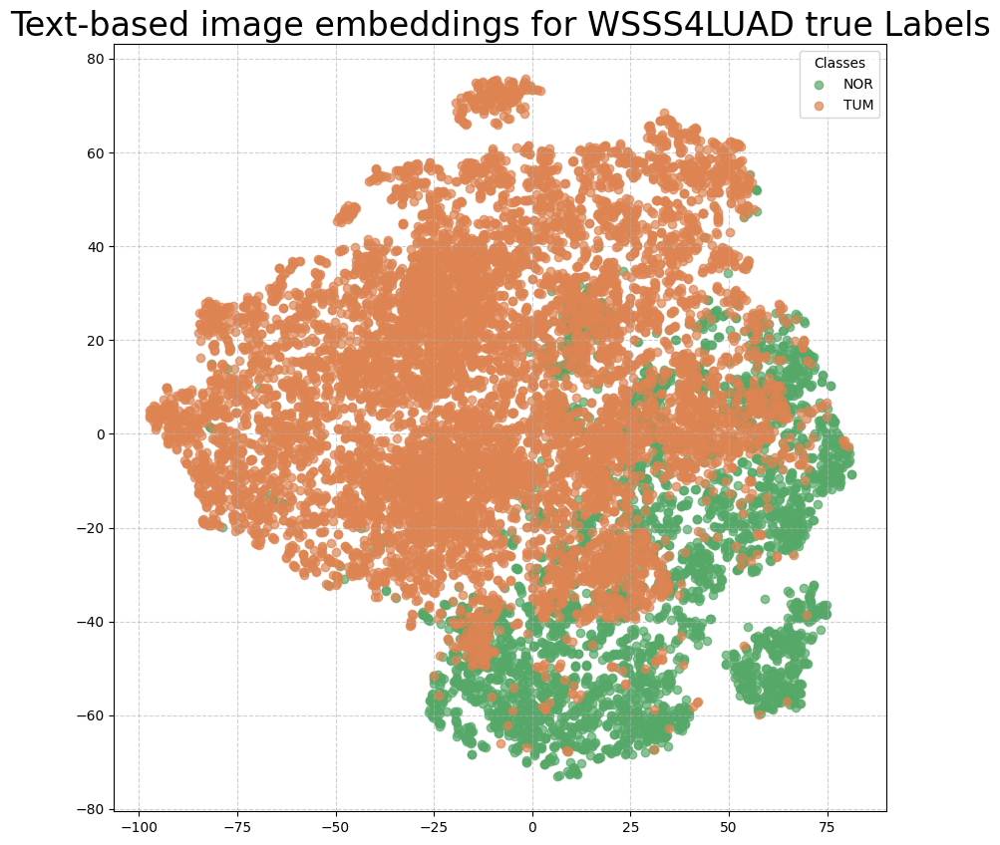

Clustering Bladder


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (3), which ma

Clustering Bladder


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (3), which ma

Clustering Bladder


/tmp/ipython-input-4063114490.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  features = torch.tensor(features).numpy()
/tmp/ipython-input-4063114490.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df['label'].map(args.mapping)
/tmp/ipython-input-4063114490.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=ax,
/tmp/ipython-input-4063114490.py:69: UserWarning: The palette list has more values (4) than needed (3), which ma

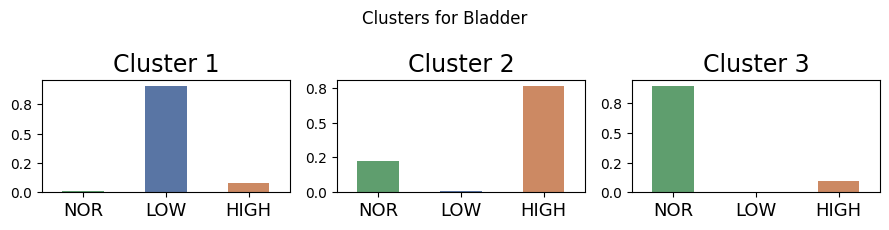

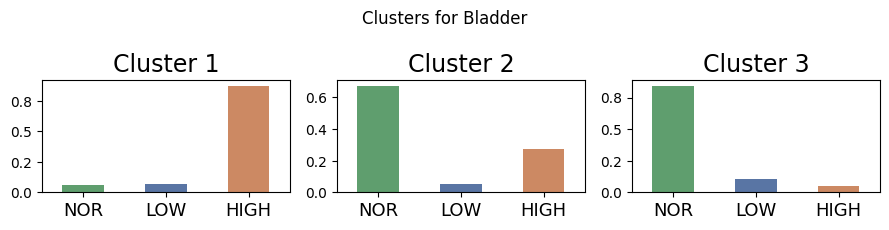

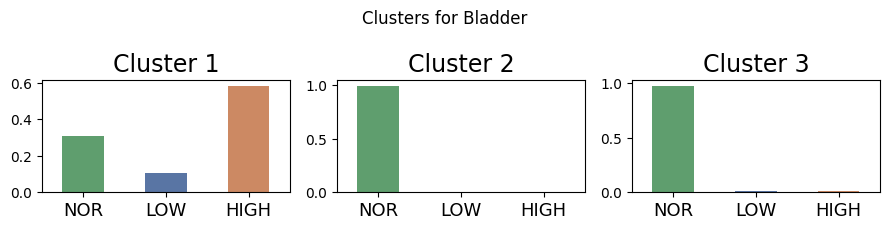

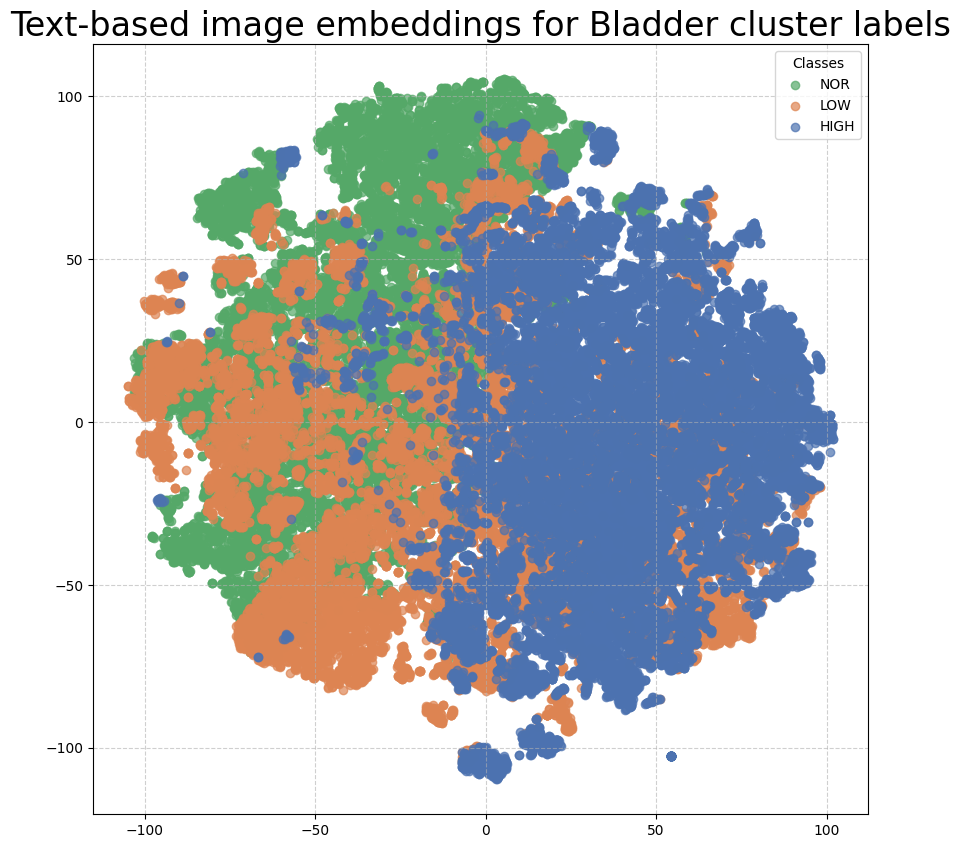

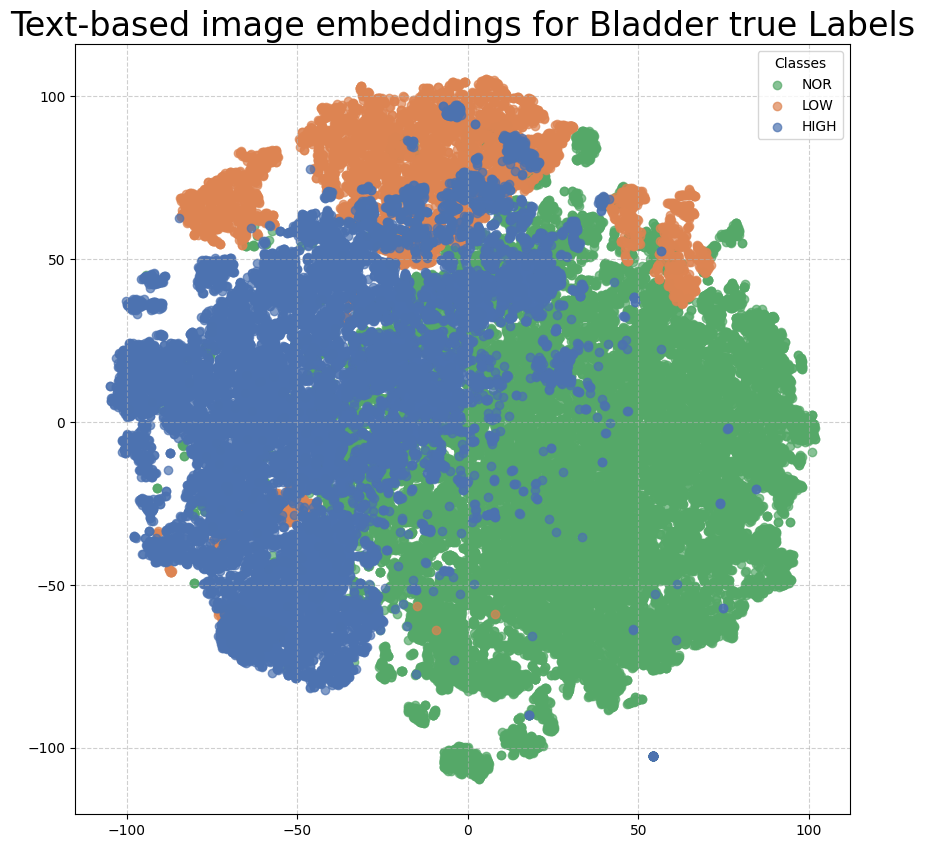

Bladder text ['Neoplastic Process;']
(0.785096854821912, 0.8678110069014334, 0.6388840529452079, np.float64(0.6101612096219726))


In [18]:
###########################################################################
# dict to store cluster labels
cluster_labels = {}

for feature_type in ['image', 'text']:
  for dataset in datasets:
    for postfix in ['_train', '_valid', '_test']:
      # run the main function
      cluster_labels[postfix], args = main(dataset, postfix, feature_type)

    # perform t-SNE after train, valid, and test pkls have been generated
    # first use cluster_labels as first arg to let it know to use cluster labels
    plotting_data_split(cluster_labels, args)
    # then use empty cluster_labels arg to let it know to use ground truth labels
    plotting_data_split({}, args)
    # empty out cluster_labels so that we just pass cluster_labels per dataset
    cluster_labels = {}
    # for each dataset, perform classification
    classify(args)

The code below will display the classification results for the desired dataset(s).

In [31]:
classification_results = {
    'BACH': [],
    'Colon': [],
    'Bladder': []
}

# for each dataset, set file_path, read into df and display df
for dataset in datasets:
  if dataset != 'WSSS4LUAD':
    file_path = f'{dataset}_classification_results.csv'
    df = pd.read_csv(file_path)
    classification_results[dataset] = df

In [32]:
classification_results_df = pd.concat(classification_results, axis=0)
display(classification_results_df)

dataset             filters feature_type            acc  \
BACH    0     BACH  Neoplastic_Process       Visual  0.7506+0.0171   
        1     BACH  Neoplastic_Process   Text-based  0.7311+0.0211   
Colon   0    Colon  Neoplastic_Process       Visual  0.8166+0.0178   
        1    Colon  Neoplastic_Process   Text-based  0.7926+0.0223   
Bladder 0  Bladder  Neoplastic_Process       Visual  0.8611+0.0085   
        1  Bladder  Neoplastic_Process   Text-based  0.7917+0.0059   

              acc_cancer             f1          kappa  
BACH    0  0.6481+0.0236  0.6600+0.0195  0.7615+0.0435  
        1  0.6036+0.0368  0.5878+0.0229  0.8004+0.0361  
Colon   0  0.7458+0.0253  0.7778+0.0136  0.9129+0.0083  
        1  0.7159+0.0311  0.7457+0.0133  0.9028+0.0111  
Bladder 0  0.8579+0.0093  0.7260+0.0134  0.7493+0.0150  
        1  0.8720+0.0044  0.6541+0.0127  0.6193+0.0102

WSSS4LUAD must be displayed separately, as it uses different metrics.

In [33]:
file_path = f'WSSS4LUAD_classification_results.csv'
luad_df = pd.read_csv(file_path)
display(luad_df)

,dataset,filters,feature_type,acc,precision,f1,recall
0,WSSS4LUAD,Neoplastic_Process,Visual,0.8384+0.0173,0.6147+0.0156,0.6398+0.0215,0.8871+0.0075
1,WSSS4LUAD,Neoplastic_Process,Text-based,0.9052+0.0074,0.6556+0.0086,0.7034+0.0108,0.8535+0.0189


The ode below will display the silhouette scores for the desired dataset(s).

In [26]:
silhouette_scores = {
    'BACH': [],
    'Colon': [],
    'WSSS4LUAD': [],
    'Bladder': []
}

for dataset in datasets:
  file_path = f'{dataset}_silhouette.csv'
  df = pd.read_csv(file_path)
  silhouette_scores[dataset] = df

In [28]:
silhouette_scores_df = pd.concat(silhouette_scores, axis=0)
display(silhouette_scores_df)

dataset feature_type  silhouette
BACH      0       BACH       Visual        0.01
          1       BACH   Text-based        0.12
Colon     0      Colon       Visual        0.11
          1      Colon   Text-based        0.10
WSSS4LUAD 0  WSSS4LUAD       Visual        0.12
          1  WSSS4LUAD   Text-based        0.24
Bladder   0    Bladder       Visual        0.04
          1    Bladder   Text-based        0.09

# QUILTNet

In [ ]:
# access most recent version of QUILTNet
model_id = "wisdomik/QuiltNet-B-16"

tokenizer = CLIPTokenizer.from_pretrained(model_id)
model = CLIPModel.from_pretrained(model_id)
processor = CLIPProcessor.from_pretrained(model_id)

device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device)
model.eval()

In [ ]:
# selected terms using prompt template
text_1 = ["A histopathology image of Angiomyoma"]
text_2 = ["A histopathology image of Myxoma of the endocardium"]
text_3 = ["A histopathology image of Fibromatosis"]
text_4 = ["A histopathology image of Leiomyomatosis"]
text_5 = ["A histopathology image of Clear-Cell Sugar Tumors"]

In [ ]:
# generate text embeddings for each prompt and store them in a list
text_embeddings = []
for text in [text_1, text_2, text_3, text_4, text_5]:
  inputs = tokenizer(
      text,
      padding=False,
      truncation=False,
      return_tensors="pt"
  ).to(device)

  with torch.no_grad():
      outputs = model.get_text_features(**inputs)

  text_embeddings.append(outputs)

In [ ]:
# image_path = '/content/116655_011.png'
# image = Image.open(image_path)

# # Preprocess the image
# inputs = processor(images=image, return_tensors="pt").to(device)

# # Get image embeddings
# with torch.no_grad():
#     image_embeddings = model.get_image_features(**inputs)

# print(image_embeddings.shape)
# print(image_embeddings)

In [ ]:
# # Ensure both tensors are on the same device
# image_embedding = image_embeddings.to(device)
# similarities = []
# for text_embedding in text_embeddings:
#   text_embedding = text_embedding.to(device)

#   # Compute cosine similarity
#   cosine_sim = F.cosine_similarity(image_embedding, text_embedding)
#   similarities.append(cosine_sim)

In [ ]:
# indices = [4, 0, 3]
# top_m = [text_embeddings[i] for i in indices]
# top_sim = [similarities[i] for i in indices]

In [ ]:
# arr = np.array(top_sim)
# normalized_values = softmax(arr)

# print("Original array:", arr)
# print("Normalized values (percentages):", normalized_values)

4.0066e-02, -3.5765e-02, ..., -6.8219e-02,  3.3002e-02

5.2821e-02, -5.5437e-02, ..., 8.4618e-03,  1.0404e-01

7.6168e-03, -2.3095e-02, ..., 6.1419e-02,  2.9092e-02

In [ ]:
# (top_m[0] * top_sim[0]) + (top_m[1] * top_sim[1]) + (top_m[2] * top_sim[2])

# Dimensionality and File Analysis

Each embedding is dimension 512

Image-text embeddings:

* BACH train, valid, test counts:
torch.Size([8752, 512]),torch.Size([2674, 512]),torch.Size([2832, 512])
* Colon train, valid, test counts:
torch.Size([7027, 512]),torch.Size([1242, 512]),torch.Size([1588, 512])
* WSSS4LUAD train, valid, test counts:
torch.Size([10091, 512]),torch.Size([1372, 512]),torch.Size([2063, 512])
* Bladder train, valid, test counts:
torch.Size([26450, 512]),torch.Size([12912, 512]),torch.Size([19204, 512])

entity_ALL_FEATURES.pkl contains the embeddings of all the pathology terms. They collect all keywords from QUILT-1M, cross-check and process with all terms in the Unified Medical Language System UMLS, eliminate duplicate terms, the raw WOI (entity.csv and $W_{Level-0}$) is 28,292 words.

all_img_features.pkl contains the visual embeddings of all images per dataset per split.

In [ ]:
for dataset in datasets:
  args.dataset = dataset
  train_feature_path = f'results/{args.dataset}/Neoplastic_Process_1000_1000/image_text_representation_train.pkl'
  with open(train_feature_path, 'rb') as f:
      train_feature = pickle.load(f)

  valid_feature_path = f'results/{args.dataset}/Neoplastic_Process_1000_1000/image_text_representation_valid.pkl'
  with open(valid_feature_path, 'rb') as f:
      valid_feature = pickle.load(f)

  test_feature_path = f'results/{args.dataset}/Neoplastic_Process_1000_1000/image_text_representation_test.pkl'
  with open(test_feature_path, 'rb') as f:
      test_feature = pickle.load(f)

  print('train_feature: '+ str(train_feature.shape))
  print('valid_feature: '+ str(valid_feature.shape))
  print('test_feature: '+ str(test_feature.shape))

# Images

In [23]:
###########################################################################
# arrays of paths for images
plot_image_paths = {
    'BACH': [],
    'Colon': [],
    'WSSS4LUAD': [],
    'Bladder': []
}

# populate list only for desired dataset
for dataset in datasets:
  plot_image_paths[dataset].append(f'tsne_Visual embeddings_{dataset}_cluster_labels.png')
  plot_image_paths[dataset].append(f'tsne_Visual embeddings_{dataset}_true_labels.png')
  plot_image_paths[dataset].append(f'tsne_Text-based image embeddings_{dataset}_cluster_labels.png')
  plot_image_paths[dataset].append(f'tsne_Text-based image embeddings_{dataset}_true_labels.png')

In [24]:
# combine all image path arrays
# image_paths.values() retrieves all lists from image_paths
# outer loop is for sublist in image_paths.values(). grabs each list
# inner loop is for path in sublist. grabs each path in a list
# every path value encountered during the loops will be collected
all_image_paths = [path for sublist in plot_image_paths.values() for path in sublist]

# open the images
all_images = [Image.open(p) for p in all_image_paths]

# resize all images
w, h = 3000, 3000
all_images = [img.resize((w, h)) for img in all_images]

# create blank canvas for all images
NUM_COL = 4
NUM_ROW = len(datasets)
grid_w, grid_h = NUM_COL * w, NUM_ROW * h
canvas = Image.new('RGB', (grid_w, grid_h))

for img_idx, img in enumerate(all_images):
  # integer division for rows 0-3, row changes every 4 images
  row = img_idx // NUM_COL
  # modulo for idx 0-3, changes for every image
  col = img_idx % NUM_COL
  x = col * w
  y = row * h
  # paste each image into its corresponding place in the canvas
  canvas.paste(img, (x, y))

canvas.save("Figure 2 Recreation.png")

In [34]:
###########################################################################
# array of paths for bar graph images
bar_graph_paths = {
    'Colon': 'results/Colon/Neoplastic_Process_1000_1000/k-4_train-within.png',
    'WSSS4LUAD': 'results/WSSS4LUAD/Neoplastic_Process_1000_1000/k-2_train-within.png',
    'BACH': 'results/BACH/Neoplastic_Process_1000_1000/k-4_train-within.png',
    'Bladder': 'results/Bladder/Neoplastic_Process_1000_1000/k-3_train-within.png'
}

# combine all image path arrays
all_image_paths = [bar_graph_paths[dataset] for dataset in datasets]

# open the images
all_images = [Image.open(p) for p in all_image_paths]

w, h = 7200, 1380

# create blank canvas for all images
NUM_COL = 1
NUM_ROW = 4
grid_w, grid_h = NUM_COL * w, NUM_ROW * h
canvas = Image.new('RGB', (grid_w, grid_h))

for img_idx, img in enumerate(all_images):
  x = 0
  y = img_idx * h
  # paste each image into its corresponding place in the canvas
  canvas.paste(img, (x, y))

canvas.save("Figure 3 Recreation.png")